# Load libraries

In [1]:
library(ggplot2) ##plotting package
library(ggridges) ## plot ridge plot with ggplot2
library(cowplot) ##plots + arrange plots etc
library(factoextra) ##plot, PC plots .etc
#library(pheatmap) ##plot heatmaps
#library(grid) ##arrange plots
#library(gridExtra) ##arrange plots (used with grid in this notebook)
library(RColorBrewer) ## color palettes
#library(extrafont) ##call various fonts in plots 
library(dplyr) ## for the R pipes
library(tidyr) ## for tidying the dataframes
library(distances) ## fast distance calculations
library(biomaRt)## load gene metadata from biomaRt
library(org.Hs.eg.db) # get gene data from this database

Welcome! Want to learn more? See two factoextra-related books at https://goo.gl/ve3WBa


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basena

# Functions 

## PCA plot with custom colours

In [2]:
gg_pca <- function(df,pc_a, pc_b,col_by,
                   palette, title, xlable,ylable, legendlab ){
    #' Generate PCA plot
    #' 
    #' @description This function will return PCA plot 
    #' 
    #' @param df data.frame with PC values
    #' @param pc_a string of PC to plot on the x axis
    #' @param pc_b string of PC to plot on the y axis
    #' @param col_by string representing how to group the colors
    #' @param palette string string of color palette to use
    #' @param title string of the plot title
    #' @param xlable string
    #' @param ylable string
    #' @param lagendlab string
    #' 
    #' @usage gg_pca(df,pc_a, pc_b,col_by,
    #'               palette, title, xlable,ylable, legendlab )
    #' @return PCA plot
    #' @export
    
    ggplot(df, aes(pc_a, pc_b, fill=col_by)) +
    ylab(ylable) + xlab(xlable) + ggtitle(title) +
    geom_point(size=5,shape=21,color="gray40") + theme_bw() +
    scale_fill_brewer(name = legendlab,palette=palette)+
    theme(panel.grid.major = element_blank(), 
          panel.grid.minor = element_blank(),
          panel.background = element_rect(colour = "black", size=0.75))+
    theme(plot.title = element_text(hjust = 0.5),
          title = element_text(size = 24, face = "bold"), 
          axis.title = element_text(size = 20,face = "bold"), 
          axis.text = element_text(size = 18),
         legend.title = element_text(size = 18),
     legend.text = element_text(size = 16))
    
}

## PCA plot with color palette

In [3]:
gg_pca_palette  <- function(df,pc_a, pc_b,col_by,
                   palette, title, xlable,ylable, legendlab ){
    #' Generate PCA plot
    #' 
    #' @description This function will return PCA plot 
    #' 
    #' @param df data.frame with PC values
    #' @param pc_a string of PC to plot on the x axis
    #' @param pc_b string of PC to plot on the y axis
    #' @param col_by string representing how to group the colors
    #' @param palette string string of color palette to use
    #' @param title string of the plot title
    #' @param xlable string
    #' @param ylable string
    #' @param lagendlab string
    #' 
    #' @usage gg_pca(df,pc_a, pc_b,col_by,
    #'               palette, title, xlable,ylable, legendlab )
    #' @return PCA plot
    #' @export
    
    ggplot(df, aes(pc_a, pc_b, fill=col_by)) +
    ylab(ylable) + xlab(xlable) + ggtitle(title) +
    geom_point(size=5,shape=21,color="gray40") + theme_bw() +
    scale_fill_manual(name = legendlab,values=palette)+
    theme(panel.grid.major = element_blank(), 
          panel.grid.minor = element_blank(),
          panel.background = element_rect(colour = "black", size=0.75))+
    theme(plot.title = element_text(hjust = 0.5),
          title = element_text(size = 24, face = "bold"), 
          axis.title = element_text(size = 20,face = "bold"), 
          axis.text = element_text(size = 18),
         legend.title = element_text(size = 18),
     legend.text = element_text(size = 16))
    
}

# Load data

## Normalized Counts

In [4]:
# load normalized counts as a data.table
gn_bdr_tpm_updated_dt <- data.table::fread('/Users/rusi2317/projects/DBNascent_Analysis/data/final_counts/genes_5ptrunc_bidirectionals_tpm500bp_promoters.tsv.gz')#genes_5ptrunc_bidirectionals_tpm.tsv.gz')
gn_bdr_tpm_updated_dt$num_zeros <- rowSums(gn_bdr_tpm_updated_dt[,6:885] == 0)
gn_bdr_tpm_updated_dt$percent_zero_samples <- (gn_bdr_tpm_updated_dt$num_zeros/880)*100
gn_bdr_tpm_updated_dt$percent_transcribed <- 100-gn_bdr_tpm_updated_dt$percent_zero_samples

## convert the data.table to data.frame
gn_bdr_tpm_updated_df <- as.data.frame(gn_bdr_tpm_updated_dt)
dim(gn_bdr_tpm_updated_df)
head(gn_bdr_tpm_updated_df)


[1] 284441    896

,chromosome,start,end,GeneID,Length,SRZ1950491,SRZ1950493,SRZ1950495,SRZ1950497,SRZ1950499,⋯,variance,mean,median,coefvar,max,bidir,bidir_id,num_zeros,percent_zero_samples,percent_transcribed
,<chr>,<int>,<int>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>
1,chr1,77562416,77681908,ZZZ3,119493,5.82945457,8.3145779,5.980257048,6.282368367,6.34099874,⋯,16.032880,6.242682,5.6444509,0.6414082,36.13679,,Gene,0,0.0000000,100.00000
2,chr17,4004445,4142280,ZZEF1,137836,2.96570797,3.6729336,3.443278075,3.309437669,3.71085744,⋯,7.419826,4.139845,3.6015431,0.6579801,18.42629,,Gene,0,0.0000000,100.00000
3,chr7,143382095,143391111,ZYX,9017,1.32486628,0.9145094,0.362819651,0.495713321,0.84116989,⋯,361.514236,14.768354,8.2922904,1.2874507,185.82795,,Gene,0,0.0000000,100.00000
4,chr1,52727203,52827336,ZYG11B,100134,2.26242489,2.5953030,1.638250776,1.865425871,2.23744361,⋯,4.394865,2.540616,2.0888459,0.8251515,21.45492,,Gene,0,0.0000000,100.00000
5,chr1,52843510,52894995,ZYG11A,51486,0.02531241,0.0000000,0.009077488,0.009138605,0.01133218,⋯,10.830205,2.180554,0.9981141,1.5092163,28.23736,,Gene,8,0.9090909,99.09091
6,chr3,126458901,126475169,ZXDC,16269,4.43249906,5.1300536,4.639449997,4.063352682,5.31961664,⋯,30.239947,8.319729,7.1572096,0.6609694,53.80431,,Gene,0,0.0000000,100.00000


In [5]:
##reorder the bidirectional ids as factors
gn_bdr_tpm_updated_df$bidir_id <- factor(gn_bdr_tpm_updated_df$bidir_id, 
                                         levels = c('dREG','Tfit','Tfit & dREG','Gene'))

## Metadata


In [6]:
##fxn to convert the first letter to uppercase
first_letter_uppper <- function(x) {
  substr(x, 1, 1) <- toupper(substr(x, 1, 1))
  return(x)
}

In [7]:
metadata_celltype <- data.table::fread('/Users/rusi2317/projects/DBNascent-build/230131_db_output.tsv')
metadata_celltype$Tissue <- first_letter_uppper(metadata_celltype$tissue)
dim(metadata_celltype)
head(metadata_celltype)

[1] 2880   15

organism,tissue,tissue_description,disease,srp,paper_id,protocol,sample_name,sample_type,cell_type,samp_qc_score,samp_data_score,replicate,control_experimental,Tissue
<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>
A. thaliana,seed,seed,0,SRP076266,Hetzel2016nascent,GRO-cap,SRR3647033,tissue,seed,3,1,1,control,Seed
A. thaliana,seed,seed,0,SRP076266,Hetzel2016nascent,GRO-seq,SRR3647034,tissue,seed,4,1,1,control,Seed
A. thaliana,seed,seed,0,SRP076266,Hetzel2016nascent,GRO-seq,SRR3647035,tissue,seed,3,1,2,control,Seed
A. thaliana,seedling,seedling,0,SRP101403,Liu2018arabidopsis,GRO-seq,SRR5313794,tissue,seedling,5,1,1,experimental,Seedling
A. thaliana,seedling,seedling,0,SRP101403,Liu2018arabidopsis,GRO-seq,SRR5313795,tissue,seedling,4,1,2,experimental,Seedling
A. thaliana,seedling,seedling,0,SRP101403,Liu2018arabidopsis,GRO-seq,SRR5313796,tissue,seedling,4,1,1,control,Seedling




# Compare transcript features
 
## Transcript lengths

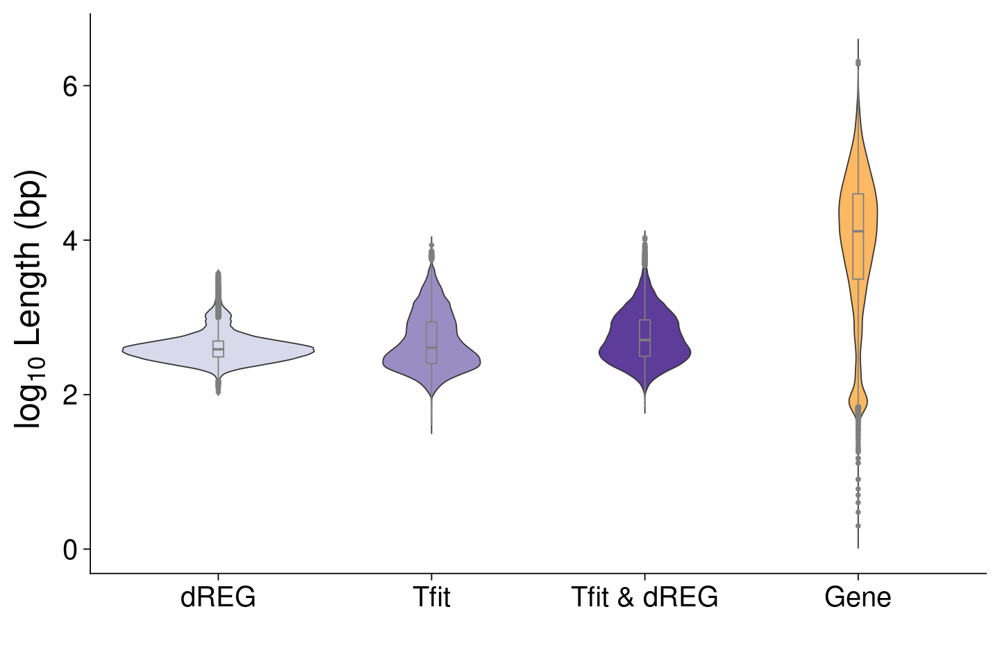

In [8]:
options(repr.plot.width=12, repr.plot.height=8)
g1 <- ggplot(gn_bdr_tpm_updated_df, aes(x=bidir_id, 
                          y=log(Length, base=10),
                         fill=bidir_id)) + 
    geom_violin(trim=FALSE) +
ylab(expression(paste(log[10]," Length (bp)", sep=' ')) )+
xlab(' ') + 
geom_boxplot(width=0.05, color='grey50', alpha=0.95, position = position_dodge(0.9)) + 
scale_fill_manual(name=' ',
                  values = c("#d8daeb","#998ec3","#5e3c99","#fdb863"),
                 labels = c('dREG only','Tfit only','Intersect','Genes')) +
theme_cowplot(24) +
theme(plot.title = element_text(hjust = 0.5)) +
theme(plot.title = element_text(hjust = 0.5),
      title = element_text(size = 34,  face = "bold"), 
      axis.title = element_text(size = 30, face = "bold"), 
      axis.text.x = element_text(size = 24),
      axis.text.y = element_text(size = 24),
     legend.title = element_text(size = 26),
     legend.text = element_text(size = 24),
     legend.position = "none") 

g1

In [9]:
ggsave(g1, width = 12, height = 8,
       filename = "/Users/rusi2317/projects/DBNascent_Analysis/figures/human_transcript_length_supplement_figure.pdf", 
       bg = "transparent")

ggsave(g1, width = 12, height = 8,
       filename = "/Users/rusi2317/projects/DBNascent_Analysis/figures/human_transcript_length_supplement_figure.png", 
       bg = "transparent")

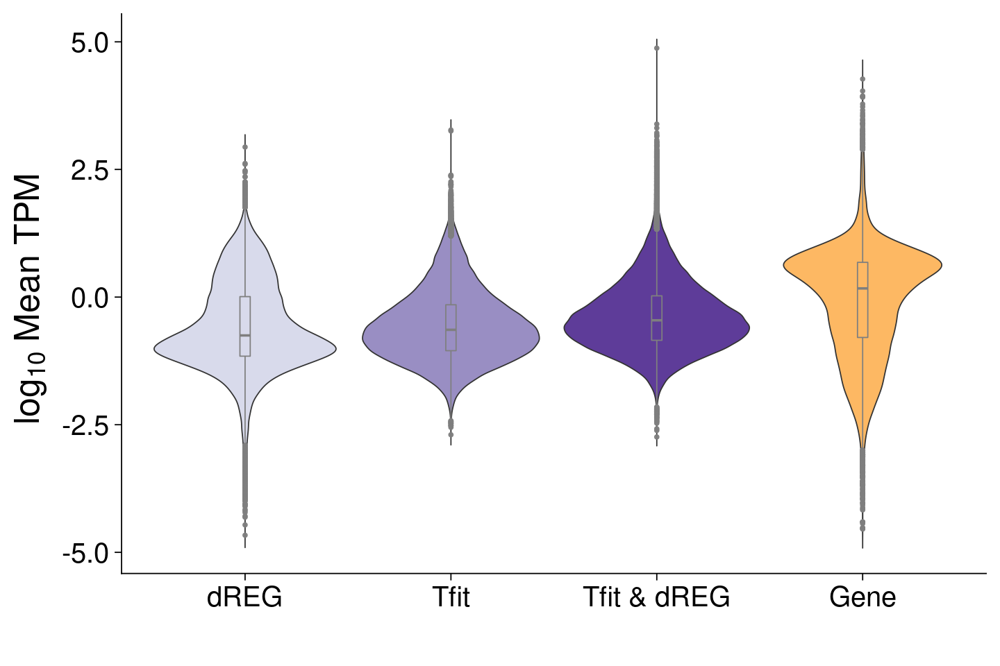

In [10]:
options(repr.plot.width=12, repr.plot.height=8)
g2 <- ggplot(gn_bdr_tpm_updated_df, aes(x=bidir_id, 
                          y=log(mean, base=10),
                         fill=bidir_id)) + 
    geom_violin(trim=FALSE) +
ylab(expression(paste(log[10]," Mean TPM", sep=' ')) )+
xlab(' ') + 
geom_boxplot(width=0.05, color='grey50', alpha=0.95, position = position_dodge(0.9)) +
scale_fill_manual(name=' ',
                  values = c("#d8daeb","#998ec3","#5e3c99","#fdb863"),
                 labels = c('dREG only','Tfit only','Intersect','Genes')) +
theme_cowplot(24) +
theme(plot.title = element_text(hjust = 0.5)) +
theme(plot.title = element_text(hjust = 0.5),
      title = element_text(size = 34,  face = "bold"), 
      axis.title = element_text(size = 30, face = "bold"), 
      axis.text.x = element_text(size = 24),
      axis.text.y = element_text(size = 24),
     legend.title = element_text(size = 26),
     legend.text = element_text(size = 24),
     legend.position = "none") 

g2

In [11]:
ggsave(g2, width = 12, height = 8,
       filename = "/Users/rusi2317/projects/DBNascent_Analysis/figures/human_mean_tpm_supplement_figure.pdf", 
       bg = "transparent")

ggsave(g2, width = 12, height = 8,
       filename = "/Users/rusi2317/projects/DBNascent_Analysis/figures/human_mean_tpm_supplement_figure.png", 
       bg = "transparent")

## Explore levels of transcription 

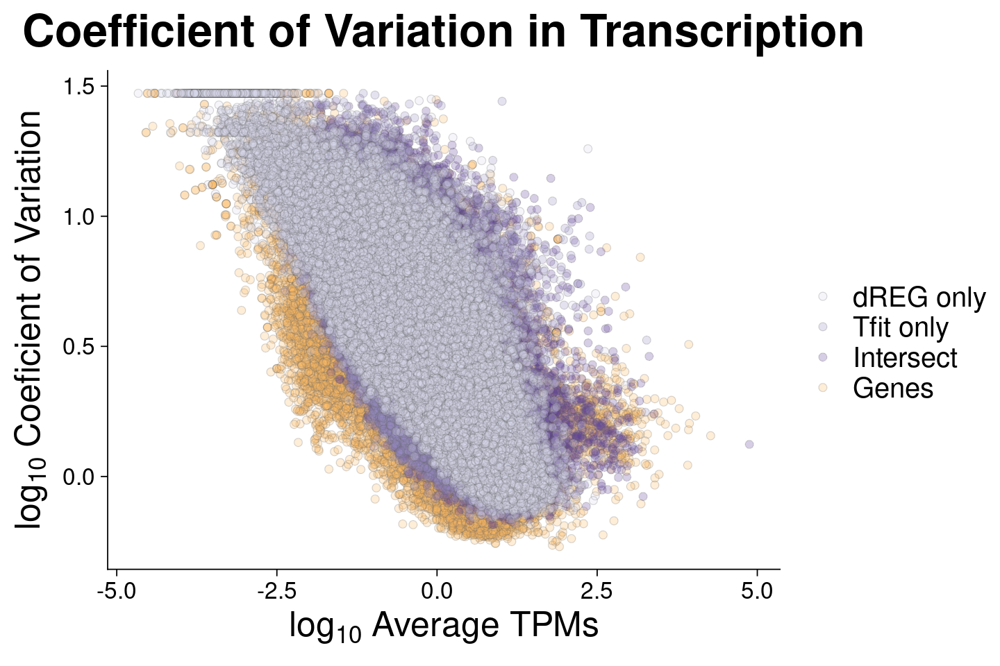

In [12]:
options(repr.plot.width=12, repr.plot.height=8)
txpt1 <- ggplot(gn_bdr_tpm_updated_df, 
       aes(x=log(mean, base=10),
           y=log(coefvar, base=10),
          fill=bidir_id)) + 
ggtitle("Coefficient of Variation in Transcription") +
xlab(expression(paste(log[10],' Average TPMs'))) + 
ylab(expression(paste(log[10], ' Coeficient of Variation', sep=""))) +
geom_point(color = 'gray40',
           size = 3,
           shape = 21,
           alpha = 0.25) + 
scale_fill_manual(name=' ', 
                  values = c("#d8daeb","#998ec3","#5e3c99","#fdb863"),
                 labels = c('dREG only','Tfit only','Intersect','Genes')) +
theme_cowplot(24) +
theme(plot.title = element_text(hjust = 0.5),
      title = element_text(size = 34,  face = "bold"), 
      axis.title = element_text(size = 30, face = "bold"), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 26),
     legend.text = element_text(size = 24)) 

txpt1

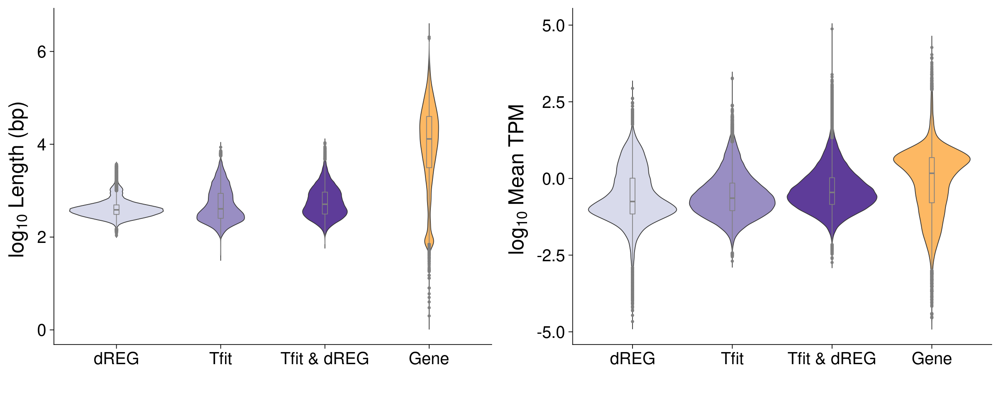

In [13]:
options(repr.plot.width=20, repr.plot.height=8)
cowplot::plot_grid(g1,g2,
          label_size = 24,
         ncol = 2, nrow = 1 )

What are these genes with high levelts of transcription AND high coefficient of variation across samples???

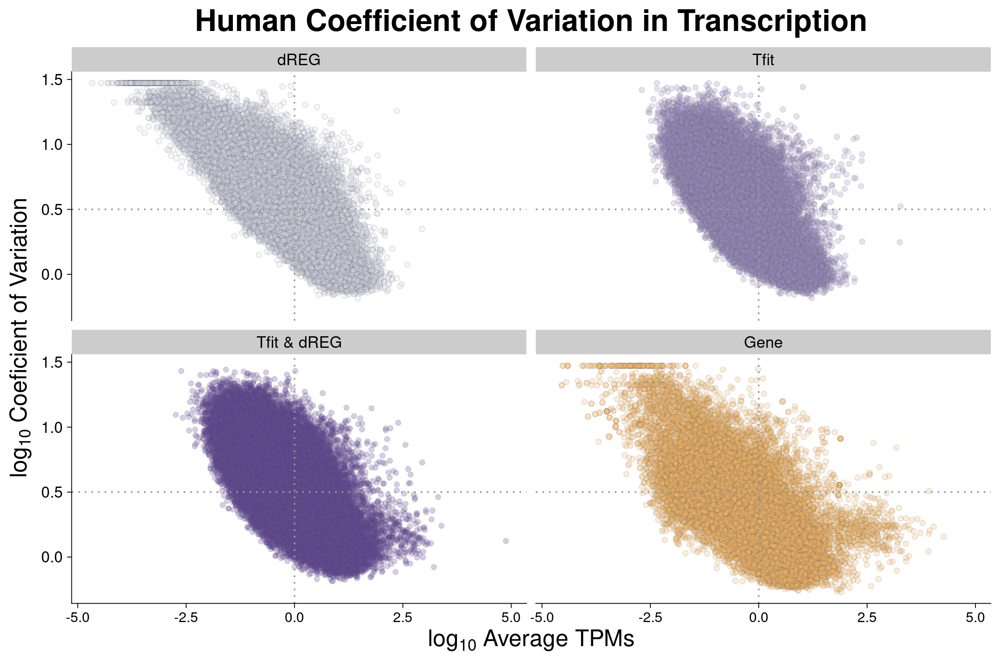

In [14]:
options(repr.plot.width=18, repr.plot.height=12)
txpt_wrap <- ggplot(gn_bdr_tpm_updated_df, 
       aes(x=log(mean, base=10),
           y=log(coefvar, base=10),
          fill=bidir_id)) + 
ggtitle("Human Coefficient of Variation in Transcription") +
xlab(expression(paste(log[10],' Average TPMs'))) + 
ylab(expression(paste(log[10], ' Coeficient of Variation', sep=""))) +
geom_point(color = 'gray40',
           size = 3,
           shape = 21,
           alpha = 0.25) + 
geom_vline(xintercept = 0, linetype="dotted", 
                color = "gray60", size=1) +
geom_hline(yintercept = 0.5, linetype="dotted", 
                color = "gray60", size=1) +
facet_wrap(vars(bidir_id), nrow = 2) +
scale_fill_manual(name=' ',
                  values = c("#d8daeb","#998ec3","#5e3c99","#fdb863"),
                 labels = c('dREG only','Tfit only','Intersect','Genes')) +
theme_cowplot(24) +
theme(plot.title = element_text(hjust = 0.5),
      title = element_text(size = 34,  face = "bold"), 
      axis.title = element_text(size = 30, face = "bold"), 
      axis.text.x = element_text(size = 18),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 26),
     legend.text = element_text(size = 24),
     legend.position = "none") 

txpt_wrap

In [15]:
ggsave(txpt_wrap, width = 18, height = 12,
       filename = "/Users/rusi2317/projects/DBNascent_Analysis/figures/human_cv_tpm_supplement_figure.pdf", 
       bg = "transparent")

ggsave(txpt_wrap, width = 18, height = 12,
       filename = "/Users/rusi2317/projects/DBNascent_Analysis/figures/human_cv_tpm_supplement_figure.png", 
       bg = "transparent")

In [16]:
high_txpt_var <- subset(gn_bdr_tpm_updated_df, 
                        log(mean, base=10) > 2.5 &
                        log(coefvar, base=10) > 0.5)
dim(high_txpt_var)
head(high_txpt_var)

[1]  16 896

,chromosome,start,end,GeneID,Length,SRZ1950491,SRZ1950493,SRZ1950495,SRZ1950497,SRZ1950499,⋯,variance,mean,median,coefvar,max,bidir,bidir_id,num_zeros,percent_zero_samples,percent_transcribed
,<chr>,<int>,<int>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<dbl>,<dbl>,<dbl>
4411,chr18,49491664,49491729,SNORD58B,66,516.68654,632.27910,662.09835,384.96290,542.19445,⋯,18517675,1020.3118,344.28673,4.217551,74532.23,,Gene,9,1.0227273,98.97727
4428,chr17,16440036,16440106,SNORD49A,71,529.24795,439.93444,483.82000,579.85413,583.44838,⋯,107929459,1493.8915,146.10504,6.954260,295734.42,,Gene,56,6.3636364,93.63636
4450,chr17,19061912,19062128,SNORD3B-2,217,73.06923,49.51594,36.61373,80.22524,73.49119,⋯,2437271,362.4303,16.95297,4.307522,14983.50,,Gene,121,13.7500000,86.25000
4451,chr17,19061912,19062128,SNORD3B-1,217,73.06923,49.51594,36.61373,80.22524,73.49119,⋯,2437271,362.4303,16.95297,4.307522,14983.50,,Gene,121,13.7500000,86.25000
4452,chr17,19188016,19188232,SNORD3A,217,5636.34049,5005.71593,3119.70549,9669.31009,6425.99829,⋯,746503444,8494.0594,2175.67570,3.216626,250234.20,,Gene,3,0.3409091,99.65909
4485,chr3,52691378,52691444,SNORD19C,67,110.22384,249.88276,216.24283,105.33811,133.52550,⋯,11344750,445.2084,23.35414,7.565438,62385.11,,Gene,181,20.5681818,79.43182


Theses appear to be mostly small nuclear RNAs (snRNAs) and small nucleolar RNAs (snoRNAs), which were excluded in the last annotation set. These tend to have high multimapped reads and should be removed as the counts for these samples will be harder to resolve. These transcripts could be included if we counted all multi-mapped reads, but for nascent RNA sequencing data, we are not including these reads.

In [17]:
high_txpt_var_genes <- subset(high_txpt_var, bidir_id == 'Gene')
print(high_txpt_var_genes$GeneID)

[1] "SNORD58B"  "SNORD49A"  "SNORD3B-2" "SNORD3B-1" "SNORD3A"   "SNORD19C" 
[7] "SNORA21"   "RNY1"      "LINC02332"


### Get biotype for all genes

In [18]:
gn_bdr_tpm_genes_df <- subset(gn_bdr_tpm_updated_df,
                              bidir_id =='Gene')
dim(gn_bdr_tpm_genes_df)

[1] 27941   896

In [19]:
# load the human biotype
mart <- useMart(biomart = "ENSEMBL_MART_ENSEMBL", 
                dataset = "hsapiens_gene_ensembl", 
                host = 'www.ensembl.org')

In [20]:
#get attributes to export
attr <- c("external_gene_name", "gene_biotype")

##get biotype information for genes
genes_biotype <- biomaRt::getBM(attributes = attr,
                        filters = "external_gene_name",
                        values = gn_bdr_tpm_genes_df$GeneID, 
                        mart = mart, useCache = FALSE)

In [21]:
unique(genes_biotype$gene_biotype)

[1] "protein_coding"                     "transcribed_unprocessed_pseudogene"
 [3] "lncRNA"                             "processed_pseudogene"              
 [5] "transcribed_unitary_pseudogene"     "unprocessed_pseudogene"            
 [7] "transcribed_processed_pseudogene"   "vault_RNA"                         
 [9] "misc_RNA"                           "unitary_pseudogene"                
[11] "snoRNA"                             "miRNA"                             
[13] "rRNA"                               "scaRNA"                            
[15] "snRNA"                              "ribozyme"                          
[17] "TEC"                                "translated_unprocessed_pseudogene" 
[19] "scRNA"

In [22]:
gn_bdr_tpm_genes_biotype <- merge(gn_bdr_tpm_genes_df, genes_biotype,
                                  by.x='GeneID', by.y='external_gene_name',
                                all.x=TRUE)
gn_bdr_tpm_genes_biotype$`Gene Biotype` <- gsub("_", " ", gn_bdr_tpm_genes_biotype$gene_biotype ) #as.character(lapply(strsplit(gn_bdr_tpm_genes_biotype$gene_biotype, '_'), `[`, 11)) #gn_bdr_tpm_genes_biotype$gene_biotype
dim(gn_bdr_tpm_genes_biotype)
head(gn_bdr_tpm_genes_biotype)

[1] 28211   898

,GeneID,chromosome,start,end,Length,SRZ1950491,SRZ1950493,SRZ1950495,SRZ1950497,SRZ1950499,⋯,median,coefvar,max,bidir,bidir_id,num_zeros,percent_zero_samples,percent_transcribed,gene_biotype,Gene Biotype
,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,A1BG,chr19,58345183,58352742,7560,4.94171936,3.801126636,2.13280981,2.4272352,3.267105126,⋯,1.672775124,1.127105,23.693943,,Gene,6,0.6818182,99.31818,protein_coding,protein coding
2,A1BG-AS1,chr19,58352720,58355183,2464,17.27773446,12.980922585,14.03608039,9.2612603,11.129088418,⋯,5.922570850,1.731331,330.423109,,Gene,25,2.8409091,97.15909,lncRNA,lncRNA
3,A1CF,chr10,50799409,50884877,85469,0.00000000,0.008770996,0.00000000,0.0000000,0.004550955,⋯,0.002811234,8.401416,15.197203,,Gene,307,34.8863636,65.11364,protein_coding,protein coding
4,A2M,chr12,9067708,9115479,47772,0.09093436,0.099384000,0.28860472,0.1428116,0.293116493,⋯,0.005986332,15.991030,116.957801,,Gene,280,31.8181818,68.18182,protein_coding,protein coding
5,A2M-AS1,chr12,9065927,9068055,2129,0.40808982,0.234741907,0.00000000,0.0000000,0.000000000,⋯,1.216783580,1.369160,27.346239,,Gene,111,12.6136364,87.38636,lncRNA,lncRNA
6,A2ML1,chr12,8845754,8876781,31028,0.00000000,0.016106920,0.02259396,0.0000000,0.012535954,⋯,0.019598497,2.318144,1.456984,,Gene,146,16.5909091,83.40909,protein_coding,protein coding


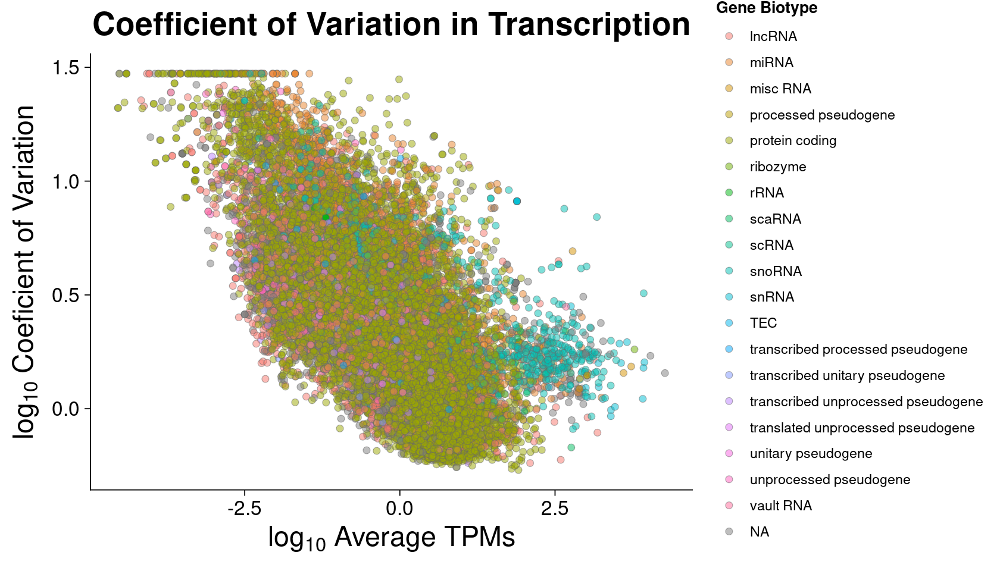

In [23]:
options(repr.plot.width=14, repr.plot.height=8)
cv_biotype <- ggplot(gn_bdr_tpm_genes_biotype, 
       aes(x=log(mean, base=10),
           y=log(coefvar, base=10),
          fill=`Gene Biotype`)) + 
ggtitle("Coefficient of Variation in Transcription") +
xlab(expression(paste(log[10],' Average TPMs'))) + 
ylab(expression(paste(log[10], ' Coeficient of Variation', sep=""))) +
geom_point(color = 'gray40',
           #fill = 'gray20',
           size = 3,
           shape = 21,
           alpha = 0.5) + 
theme_cowplot(24) +
theme(plot.title = element_text(hjust = 0.5),
      title = element_text(size = 28,  face = "bold"), 
      axis.title = element_text(size = 28, face = "bold"), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 16),
     legend.text = element_text(size = 14)) 

cv_biotype

In [24]:
ggsave(cv_biotype, width = 14, height = 8,
       filename = "/Users/rusi2317/projects/DBNascent_Analysis/figures/human_cv_tpm_biotype_supplement_figure.png", 
       bg = "transparent")

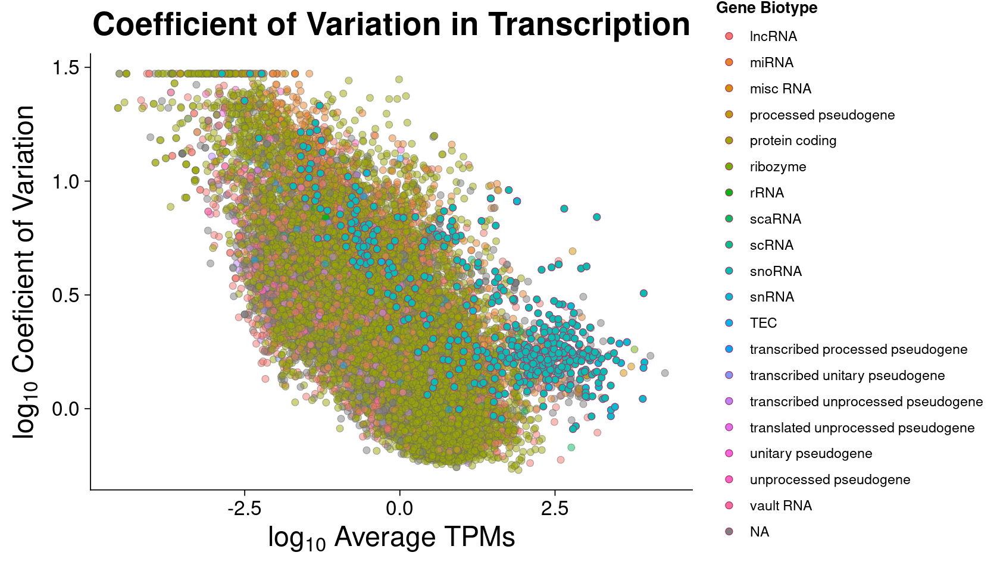

In [25]:
options(repr.plot.width=14, repr.plot.height=8)
ggplot(gn_bdr_tpm_genes_biotype, 
       aes(x=log(mean, base=10),
           y=log(coefvar, base=10),
          fill=`Gene Biotype`)) + 
ggtitle("Coefficient of Variation in Transcription") +
xlab(expression(paste(log[10],' Average TPMs'))) + 
ylab(expression(paste(log[10], ' Coeficient of Variation', sep=""))) +
geom_point(color = 'gray40',
           size = 3,
           shape = 21,
           alpha = 0.5) + 
geom_point(data=subset(gn_bdr_tpm_genes_biotype, 
                      gene_biotype=='snoRNA'| 
                       gene_biotype=='snRNA'),
          color = 'maroon',
           size = 3,
           shape = 21) +
theme_cowplot(24) +
theme(plot.title = element_text(hjust = 0.5),
      title = element_text(size = 28,  face = "bold"), 
      axis.title = element_text(size = 28, face = "bold"), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 16),
     legend.text = element_text(size = 14)) 

# PCA  analysis : Genes

## Log transform normalized counts

1. Log transform counts
2. Calculate euclidean distances between samples
3. Perform PCA on transformed data

In [26]:
nsamples <- 880
head(gn_bdr_tpm_updated_df[c(6:(nsamples+5))])

,SRZ1950491,SRZ1950493,SRZ1950495,SRZ1950497,SRZ1950499,SRZ1950501,SRZ1950503,SRZ1950505,SRZ1950507,SRZ1950509,⋯,SRR9833433,SRZ9833428,SRZ9833431,SRZ9833434,SRR11793825,SRR11793826,SRR11793827,SRR11793828,SRR11793829,SRR11793830
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,5.82945457,8.3145779,5.980257048,6.282368367,6.34099874,7.90300387,5.72014102,5.061571473,6.238290927,4.713854228,⋯,1.6417523,9.745789,1.2758497,1.6259456,5.560293,5.854207,5.407800,5.643423,0.5279793,4.530625
2,2.96570797,3.6729336,3.443278075,3.309437669,3.71085744,3.92663202,2.88491304,2.417929264,3.377978667,2.503206071,⋯,0.9983549,3.823799,0.7106638,1.0820423,4.377654,4.293882,3.599961,3.442803,0.4787957,2.945369
3,1.32486628,0.9145094,0.362819651,0.495713321,0.84116989,0.60860257,0.48460950,0.178988087,0.673621639,0.664315999,⋯,4.9466981,26.342880,4.4171130,9.8214777,15.413663,14.442057,7.510637,8.475799,1.3579248,6.731350
4,2.26242489,2.5953030,1.638250776,1.865425871,2.23744361,2.44107289,2.02346054,1.841453856,2.010119718,1.784666194,⋯,2.8256766,2.822962,1.9965896,0.6858245,3.881858,3.851474,3.262415,3.245017,0.4362710,2.877564
5,0.02531241,0.0000000,0.009077488,0.009138605,0.01133218,0.00444115,0.02233476,0.007836769,0.004068094,0.007756332,⋯,0.4818851,1.212344,0.2091079,0.2506957,6.035404,6.161138,5.291013,5.292451,0.8061700,4.896948
6,4.43249906,5.1300536,4.639449997,4.063352682,5.31961664,5.15810066,4.65088321,3.893722519,4.763442927,3.853756903,⋯,2.4333443,8.113454,2.0195602,3.2076399,5.764744,4.412697,3.455598,3.546275,0.4400926,3.607818


In [27]:
gn_tpm_updated_df <- subset(gn_bdr_tpm_updated_df, bidir_id == "Gene")
dim(gn_tpm_updated_df)

[1] 27941   896

In [28]:
# log transform tpms
gn_bdr_tpm_updated_df_log <- log(as.matrix(gn_tpm_updated_df[c(6:(nsamples+5))]+0.0000001))

In [29]:
# transpose matrix
gn_bdr_tpm_updated_df_log_t <- t(gn_bdr_tpm_updated_df_log)

In [30]:
# calculate distance using distances::distances() is faster than dist(), see link below

##https://stackoverflow.com/questions/68931399/fast-way-to-compute-distance-matrix-in-r-for-large-matrix
d <- distances::distances(gn_bdr_tpm_updated_df_log_t)

In [31]:
# get distance matrix
d_matrix <- distances::distance_matrix(d)
class(d_matrix)

[1] "dist"

In [32]:
#PCA with all samples
pc0 <- prcomp(d_matrix, rank = 4)

In [33]:
###############################
##Percent of variance explained
###############################
eigs <- pc0$sdev^2
pc1_var <- round((eigs[1] / sum(eigs))*100, digits = 2)
pc2_var <- round((eigs[2] / sum(eigs))*100, digits = 2)
pc3_var <- round((eigs[3] / sum(eigs))*100, digits = 2)
pc4_var <- round((eigs[4] / sum(eigs))*100, digits = 2)
pc1_var
pc2_var
pc3_var
pc4_var

[1] 52.96

[1] 12.05

[1] 7.58

[1] 5.03

In [34]:
pc_tpms0 <- as.data.frame(pc0$x[, 1])
colnames(pc_tpms0) <- "PC1"
pc_tpms0$PC2 <-  pc0$x[, 2]
pc_tpms0$PC3 <-  pc0$x[, 3]
pc_tpms0$PC4 <-  pc0$x[, 4]
pc_tpms0$SRR <- colnames(gn_bdr_tpm_updated_df[c(6:(nsamples+5))])
dim(pc_tpms0)
head(pc_tpms0)

[1] 880   5

,PC1,PC2,PC3,PC4,SRR
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,1262.133,-410.8588,1468.735,-164.86369,SRZ1950491
2,2017.007,-219.5332,1479.745,-82.79914,SRZ1950493
3,2005.319,-201.5529,1490.872,-130.30853,SRZ1950495
4,1945.835,-91.7074,1557.609,-20.18002,SRZ1950497
5,1146.178,-364.4835,1526.873,-166.60733,SRZ1950499
6,1627.155,-268.7911,1547.963,-132.59955,SRZ1950501


In [35]:
pc_tpms_metadata <- merge(pc_tpms0, 
                          metadata_celltype, 
                          by.x = 'SRR',
                         by.y = 'sample_name')
dim(pc_tpms_metadata)
head(pc_tpms_metadata)

[1] 880  19

,SRR,PC1,PC2,PC3,PC4,organism,tissue,tissue_description,disease,srp,paper_id,protocol,sample_type,cell_type,samp_qc_score,samp_data_score,replicate,control_experimental,Tissue
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>
1,ERR769522,8964.206,876.0032,-2073.7161,-1032.96822,H. sapiens,uterus,uterus; cervix; cervical adenocarcinoma,1,ERP009673,Laitem2015cdk9,GRO-seq,cell line,HeLa,3,2,1,experimental,Uterus
2,ERR769523,8867.322,831.0804,-2041.1248,-1002.71958,H. sapiens,uterus,uterus; cervix; cervical adenocarcinoma,1,ERP009673,Laitem2015cdk9,GRO-seq,cell line,HeLa,3,1,1,experimental,Uterus
3,ERR769524,1579.558,273.0344,-191.1223,36.09980,H. sapiens,uterus,uterus; cervix; cervical adenocarcinoma,1,ERP009673,Laitem2015cdk9,GRO-seq,cell line,HeLa,2,1,1,control,Uterus
4,ERR769525,1839.401,377.2218,-136.5605,33.65225,H. sapiens,uterus,uterus; cervix; cervical adenocarcinoma,1,ERP009673,Laitem2015cdk9,GRO-seq,cell line,HeLa,2,1,2,control,Uterus
5,SRR10298307,-1436.245,1082.2193,-284.9868,-403.44951,H. sapiens,breast,breast; mammary; adenocarcinoma,1,SRP226022,Li2021comprehensive,GRO-seq,cell line,MCF7,2,2,1,control,Breast
6,SRR10298308,-1539.868,1018.7399,-287.7771,-436.39185,H. sapiens,breast,breast; mammary; adenocarcinoma,1,SRP226022,Li2021comprehensive,GRO-seq,cell line,MCF7,1,2,2,control,Breast


In [36]:
max(table(pc_tpms_metadata$cell_type))
subset(as.data.frame(table(pc_tpms_metadata$cell_type)), Freq==186)
median(subset(as.data.frame(table(pc_tpms_metadata$cell_type)), Freq>0)$Freq)
mean(subset(as.data.frame(table(pc_tpms_metadata$cell_type)), Freq>0)$Freq)

[1] 186

,Var1,Freq
,<fct>,<int>
36,MCF7,186


[1] 6

[1] 14.42623

## PCA plots

### Color by `protocol`

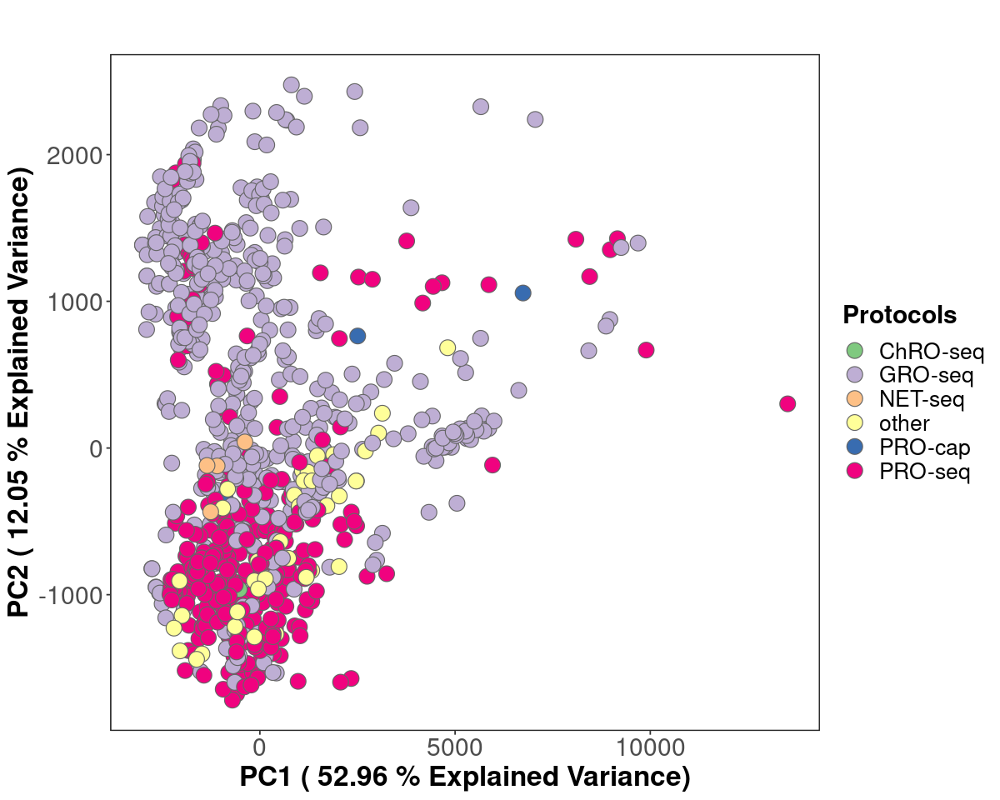

In [37]:
options(repr.plot.width=10, repr.plot.height=8)
pc1 <- gg_pca(pc_tpms_metadata, pc_tpms_metadata$PC1,
       pc_tpms_metadata$PC2, pc_tpms_metadata$protocol,"Accent", #Set2
      " ", paste("PC1 (",as.character(pc1_var),"% Explained Variance)"),
              paste("PC2 (",as.character(pc2_var),"% Explained Variance)"), "Protocols")
pc1

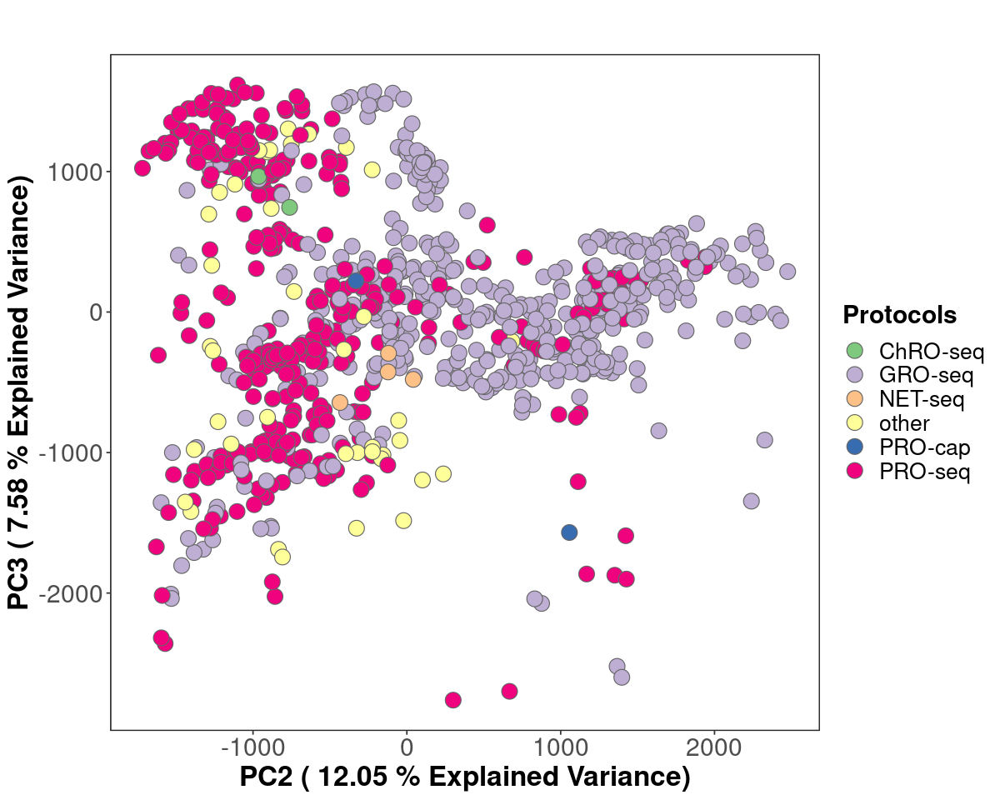

In [38]:
options(repr.plot.width=10, repr.plot.height=8)
pc1_2 <- gg_pca(pc_tpms_metadata, pc_tpms_metadata$PC2,
       pc_tpms_metadata$PC3, pc_tpms_metadata$protocol,"Accent",
      " ", paste("PC2 (",as.character(pc2_var),"% Explained Variance)"),
                paste("PC3 (",as.character(pc3_var),"% Explained Variance)"), "Protocols")
pc1_2

### Color by `cell types`

In [39]:
length(unique(pc_tpms_metadata$cell_type))
unique(pc_tpms_metadata$cell_type)

[1] 61

[1] "HeLa"                          "MCF7"                         
 [3] "MDA-MB-231"                    "foreskin fibroblast"          
 [5] "KBM7"                          "HUVEC"                        
 [7] "HAEC"                          "HEK293T Flp-In"               
 [9] "HEp2"                          "BJ5ta"                        
[11] "T47D"                          "ESC"                          
[13] "A549"                          "HCT116"                       
[15] "THP1"                          "TRExBCBL1"                    
[17] "CD34+ erythroblast"            "K562"                         
[19] "LNCaP"                         "Kasumi-1"                     
[21] "BEAS-2B"                       "LC-2/ad"                      
[23] "HAP1"                          "U2OS"                         
[25] "Nalm6"                         "REH"                          
[27] "acute myeloid leukemia cell"   "VCaP"                         
[29] "CD4+ T cell"                   "SJSA"                         
[31] "HEK293T"                       "ARPE-19"                      
[33] "HepG2"                         "MRC5"                         
[35] "NHA"                           "SKOV3"                        
[37] "T98G"                          "U87"                          
[39] "B cell"                        "BJ"                           
[41] "hematopoietic progenitor cell" "SW480"                        
[43] "HEK293"                        "NTera2/D1"                    
[45] "IMR90"                         "MV4-11"                       
[47] "iPSC"                          "hepatocyte"                   
[49] "Jurkat T cell"                 "HCC1806"                      
[51] "myoblast"                      "MEL624"                       
[53] "Ramos"                         "A375"                         
[55] "A2780"                         "SUDHL4"                       
[57] "NUDUL1"                        "OCILY1"                       
[59] "S2VP10"                        "NSPC"                         
[61] "CUTLL1"

In [40]:
# Define the number of colors you want
nb.cols <- 61
mycolors <- colorRampPalette(brewer.pal(8, "Set2"))(nb.cols)
mycolors

[1] "#66C2A5" "#77BB9D" "#89B595" "#9AAF8D" "#ACA985" "#BDA37D" "#CF9C76"
 [8] "#E0966E" "#F29066" "#F68D67" "#E99073" "#DC927F" "#CF948C" "#C29698"
[15] "#B599A4" "#A89BB0" "#9B9DBD" "#8E9FC9" "#969DCA" "#A09BC9" "#AB98C8"
[22] "#B596C7" "#C093C6" "#CA90C5" "#D58EC4" "#DF8BC3" "#E48CBF" "#DD95B2"
[29] "#D59EA5" "#CEA798" "#C6B18B" "#BEBA7E" "#B7C371" "#AFCC64" "#A8D557"
[36] "#ADD850" "#B7D84C" "#C2D848" "#CCD843" "#D6D83F" "#E1D83B" "#EBD837"
[43] "#F6D832" "#FED830" "#FBD63C" "#F8D348" "#F5D154" "#F2CE5F" "#EFCC6B"
[50] "#ECC977" "#E9C783" "#E6C58E" "#E1C296" "#DBC099" "#D5BE9D" "#D0BCA0"
[57] "#CABAA4" "#C4B8A8" "#BEB6AB" "#B8B4AF" "#B3B3B3"

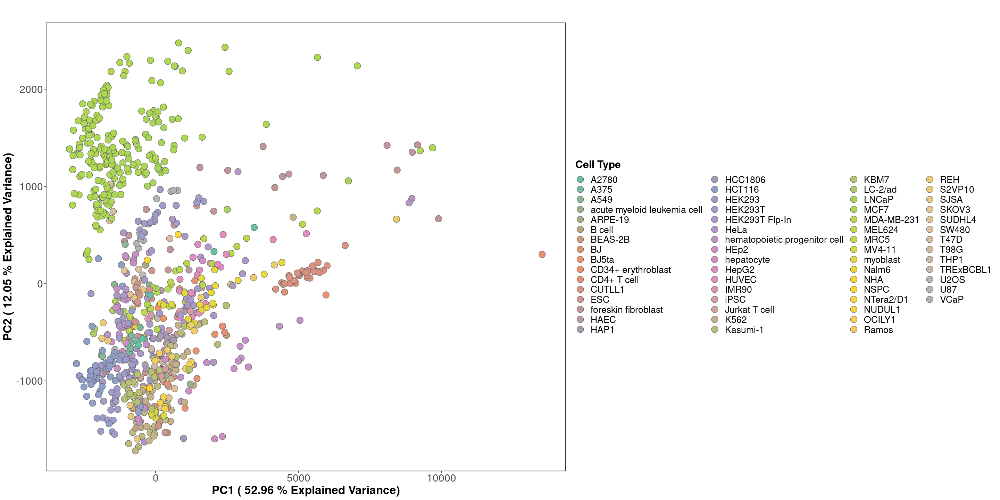

In [41]:
options(repr.plot.width=24, repr.plot.height=12)
pc3 <- gg_pca_palette(pc_tpms_metadata, pc_tpms_metadata$PC1,
       pc_tpms_metadata$PC2, pc_tpms_metadata$cell_type,mycolors,
      " ", paste("PC1 (",as.character(pc1_var),"% Explained Variance)"),
              paste("PC2 (",as.character(pc2_var),"% Explained Variance)"), "Cell Type")
pc3

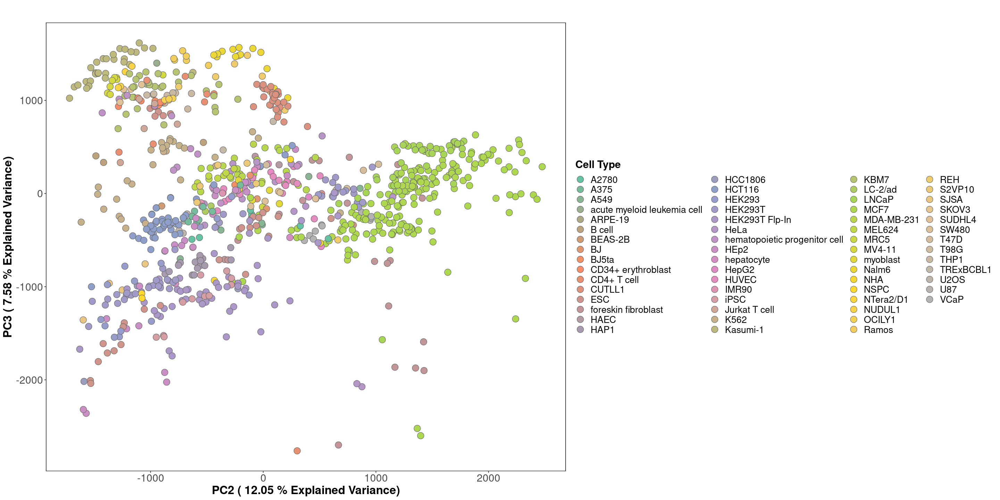

In [42]:
options(repr.plot.width=24, repr.plot.height=12)
pc3_2 <- gg_pca_palette(pc_tpms_metadata, pc_tpms_metadata$PC2,
       pc_tpms_metadata$PC3, pc_tpms_metadata$cell_type,mycolors,
      " ",  paste("PC2 (",as.character(pc2_var),"% Explained Variance)"),
                paste("PC3 (",as.character(pc3_var),"% Explained Variance)"), "Cell Type")
pc3_2

### Summarize by `tissue types`


In [43]:
head(pc_tpms_metadata)
colnames(pc_tpms_metadata)

,SRR,PC1,PC2,PC3,PC4,organism,tissue,tissue_description,disease,srp,paper_id,protocol,sample_type,cell_type,samp_qc_score,samp_data_score,replicate,control_experimental,Tissue
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>
1,ERR769522,8964.206,876.0032,-2073.7161,-1032.96822,H. sapiens,uterus,uterus; cervix; cervical adenocarcinoma,1,ERP009673,Laitem2015cdk9,GRO-seq,cell line,HeLa,3,2,1,experimental,Uterus
2,ERR769523,8867.322,831.0804,-2041.1248,-1002.71958,H. sapiens,uterus,uterus; cervix; cervical adenocarcinoma,1,ERP009673,Laitem2015cdk9,GRO-seq,cell line,HeLa,3,1,1,experimental,Uterus
3,ERR769524,1579.558,273.0344,-191.1223,36.09980,H. sapiens,uterus,uterus; cervix; cervical adenocarcinoma,1,ERP009673,Laitem2015cdk9,GRO-seq,cell line,HeLa,2,1,1,control,Uterus
4,ERR769525,1839.401,377.2218,-136.5605,33.65225,H. sapiens,uterus,uterus; cervix; cervical adenocarcinoma,1,ERP009673,Laitem2015cdk9,GRO-seq,cell line,HeLa,2,1,2,control,Uterus
5,SRR10298307,-1436.245,1082.2193,-284.9868,-403.44951,H. sapiens,breast,breast; mammary; adenocarcinoma,1,SRP226022,Li2021comprehensive,GRO-seq,cell line,MCF7,2,2,1,control,Breast
6,SRR10298308,-1539.868,1018.7399,-287.7771,-436.39185,H. sapiens,breast,breast; mammary; adenocarcinoma,1,SRP226022,Li2021comprehensive,GRO-seq,cell line,MCF7,1,2,2,control,Breast


[1] "SRR"                  "PC1"                  "PC2"                 
 [4] "PC3"                  "PC4"                  "organism"            
 [7] "tissue"               "tissue_description"   "disease"             
[10] "srp"                  "paper_id"             "protocol"            
[13] "sample_type"          "cell_type"            "samp_qc_score"       
[16] "samp_data_score"      "replicate"            "control_experimental"
[19] "Tissue"

In [44]:
metadata_hg38 <- metadata_celltype[metadata_celltype$sample_name %in% pc_tpms_metadata$SRR,]
head(metadata_hg38)

organism,tissue,tissue_description,disease,srp,paper_id,protocol,sample_name,sample_type,cell_type,samp_qc_score,samp_data_score,replicate,control_experimental,Tissue
<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>
H. sapiens,blood,blood; biphenotypic B myelomonocytic leukemia,1,SRP149838,Aho2019displacement,PRO-seq,SRR7266931,cell line,MV4-11,1,2,1,control,Blood
H. sapiens,blood,blood; biphenotypic B myelomonocytic leukemia,1,SRP149838,Aho2019displacement,PRO-seq,SRR7266932,cell line,MV4-11,2,1,2,control,Blood
H. sapiens,blood,blood; biphenotypic B myelomonocytic leukemia,1,SRP149838,Aho2019displacement,PRO-seq,SRR7266933,cell line,MV4-11,1,2,1,experimental,Blood
H. sapiens,blood,blood; biphenotypic B myelomonocytic leukemia,1,SRP149838,Aho2019displacement,PRO-seq,SRR7266934,cell line,MV4-11,1,2,2,experimental,Blood
H. sapiens,blood,blood; biphenotypic B myelomonocytic leukemia,1,SRP149838,Aho2019displacement,PRO-seq,SRR7266935,cell line,MV4-11,1,2,1,experimental,Blood
H. sapiens,blood,blood; biphenotypic B myelomonocytic leukemia,1,SRP149838,Aho2019displacement,PRO-seq,SRR7266936,cell line,MV4-11,1,2,2,experimental,Blood


In [45]:
length(unique(pc_tpms_metadata$tissue))
# Define the number of colors you want
nb.cols2 <- 20
mycolors2 <- colorRampPalette(brewer.pal(8, "Set1"))(nb.cols2)
mycolors2

[1] 19

[1] "#E41A1C" "#A43E55" "#64638E" "#3983AC" "#419583" "#49A75B" "#5C9A5C"
 [8] "#78767D" "#94539E" "#B85D6F" "#DE6F33" "#FF8502" "#FFB415" "#FFE428"
[15] "#F0E431" "#D0A62D" "#AF6729" "#BB614F" "#D97187" "#F781BF"

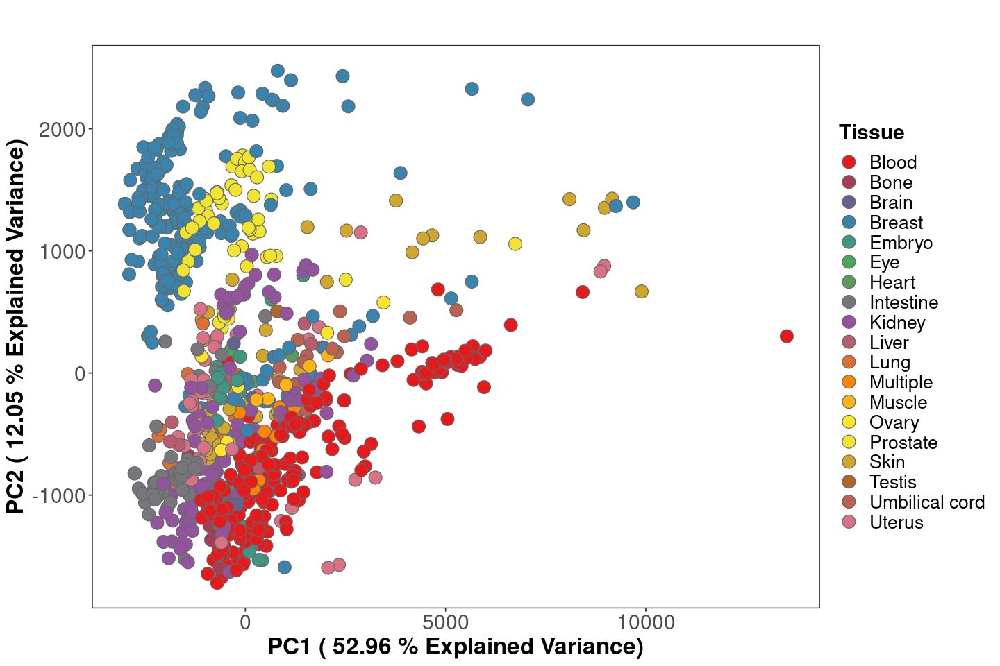

In [46]:
options(repr.plot.width=12, repr.plot.height=8)
pc3b <- gg_pca_palette(pc_tpms_metadata, pc_tpms_metadata$PC1,
       pc_tpms_metadata$PC2, pc_tpms_metadata$Tissue,mycolors2,
      " ", paste("PC1 (",as.character(pc1_var),"% Explained Variance)"),
              paste("PC2 (",as.character(pc2_var),"% Explained Variance)"), "Tissue")
pc3b

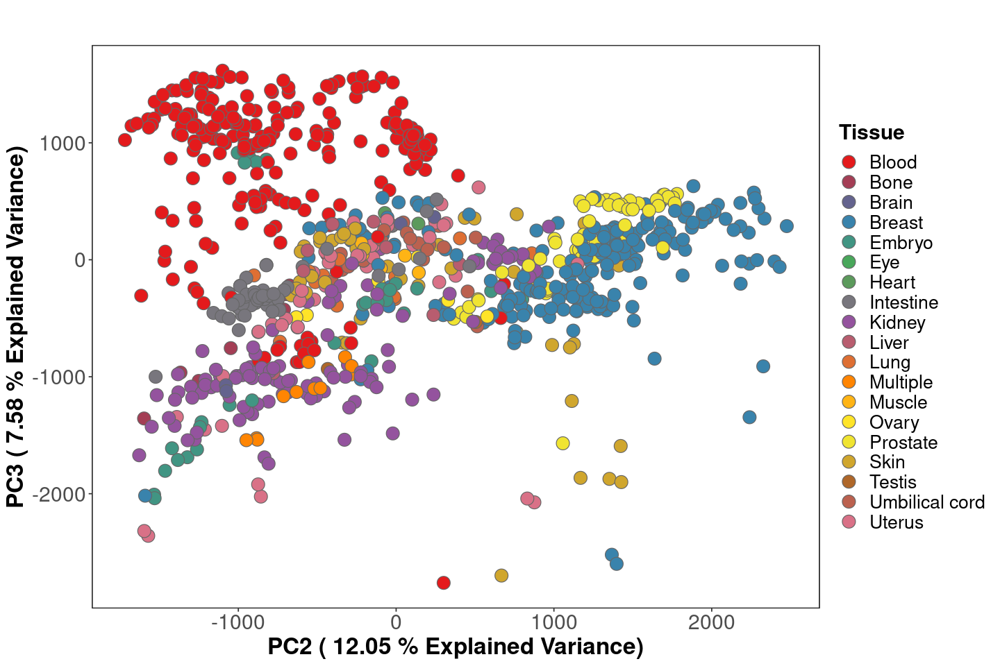

In [47]:
options(repr.plot.width=12, repr.plot.height=8)
pc3_2b <- gg_pca_palette(pc_tpms_metadata, pc_tpms_metadata$PC2,
       pc_tpms_metadata$PC3, pc_tpms_metadata$Tissue,mycolors2,
      " ",  paste("PC2 (",as.character(pc2_var),"% Explained Variance)"),
                paste("PC3 (",as.character(pc3_var),"% Explained Variance)"), "Tissue")
pc3_2b

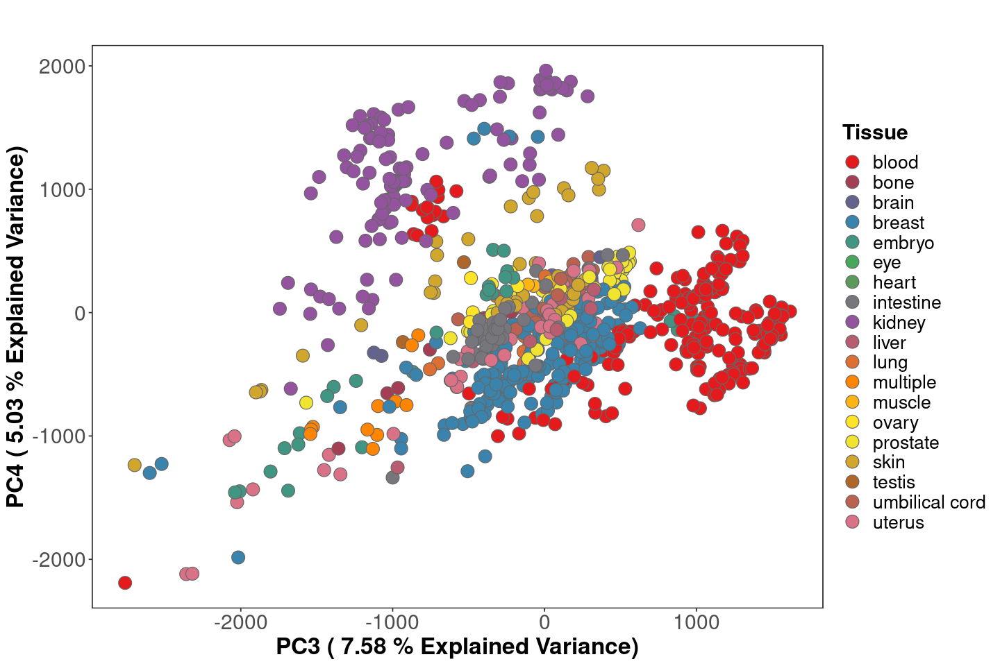

In [56]:
options(repr.plot.width=12, repr.plot.height=8)
pc3_3b <- gg_pca_palette(pc_tpms_metadata, pc_tpms_metadata$PC3,
       pc_tpms_metadata$PC4, pc_tpms_metadata$tissue,mycolors2,
      " ",  paste("PC3 (",as.character(pc3_var),"% Explained Variance)"),
                paste("PC4 (",as.character(pc4_var),"% Explained Variance)"), "Tissue")
pc3_3b

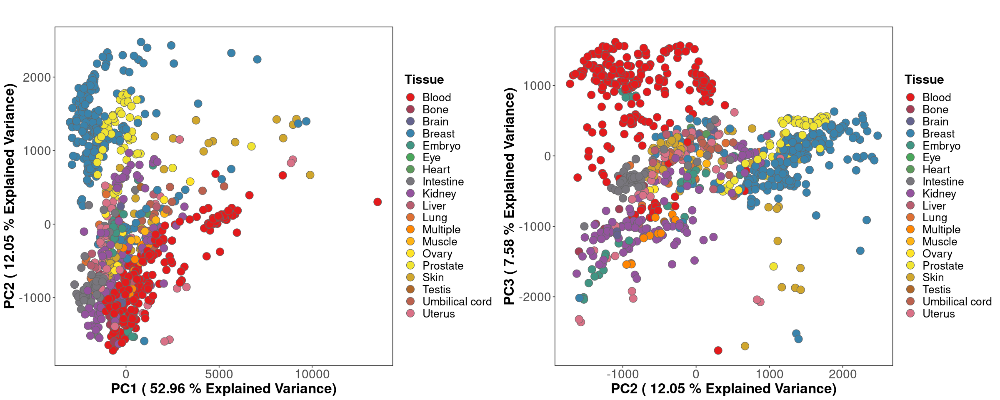

In [49]:
options(repr.plot.width=20, repr.plot.height=8)
cowplot::plot_grid(pc3b, pc3_2b,
          label_size = 24,
         ncol = 2, nrow = 1 )

In [50]:
ggsave(pc3b, width = 10, height = 8,
       filename = "/Users/rusi2317/projects/DBNascent_Analysis/figures/human_pca_tissue_pc1_pc2.pdf", 
       bg = "transparent")

ggsave(pc3_2b, width = 10, height = 8,
       filename = "/Users/rusi2317/projects/DBNascent_Analysis/figures/human_pca_tissue_pc2_pc3.pdf", 
       bg = "transparent")


### Color by `sample quality score`

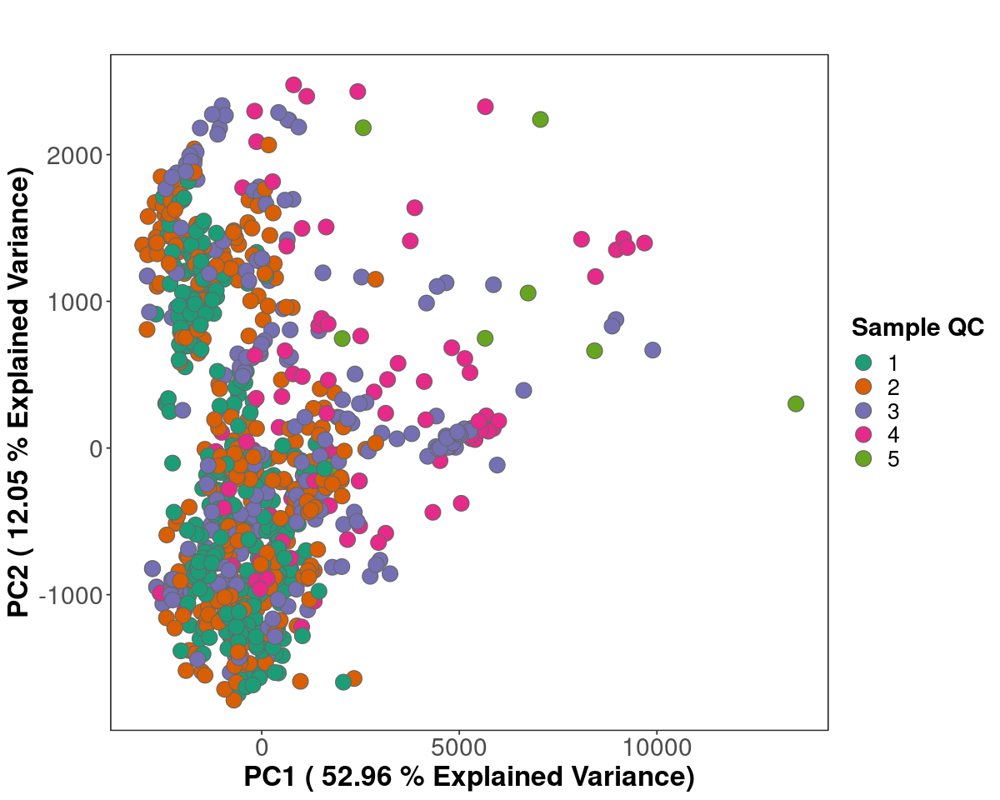

In [51]:
options(repr.plot.width=10, repr.plot.height=8)
pc4 <- gg_pca(pc_tpms_metadata, pc_tpms_metadata$PC1,
       pc_tpms_metadata$PC2, as.factor(pc_tpms_metadata$samp_qc_score),"Dark2",
      " ",paste("PC1 (",as.character(pc1_var),"% Explained Variance)"),
              paste("PC2 (",as.character(pc2_var),"% Explained Variance)"), "Sample QC")
pc4

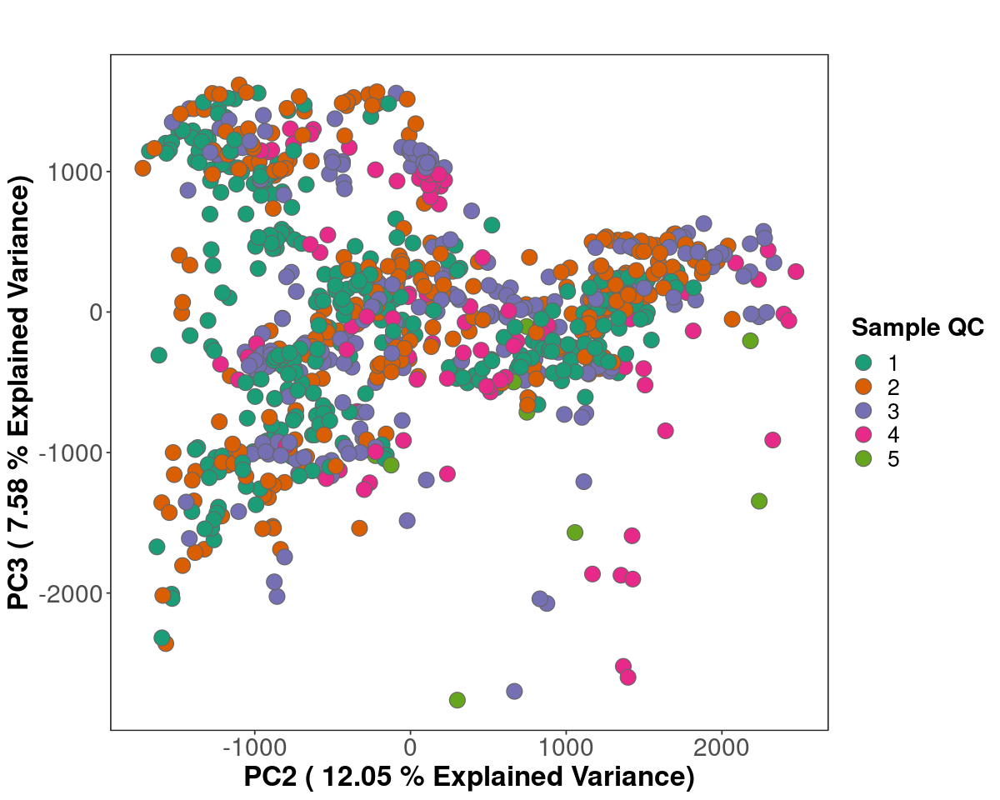

In [52]:
options(repr.plot.width=10, repr.plot.height=8)
pc4_2 <- gg_pca(pc_tpms_metadata, pc_tpms_metadata$PC2,
       pc_tpms_metadata$PC3, as.factor(pc_tpms_metadata$samp_qc_score),"Dark2",
      " ",paste("PC2 (",as.character(pc2_var),"% Explained Variance)"),
              paste("PC3 (",as.character(pc3_var),"% Explained Variance)"), "Sample QC")
pc4_2

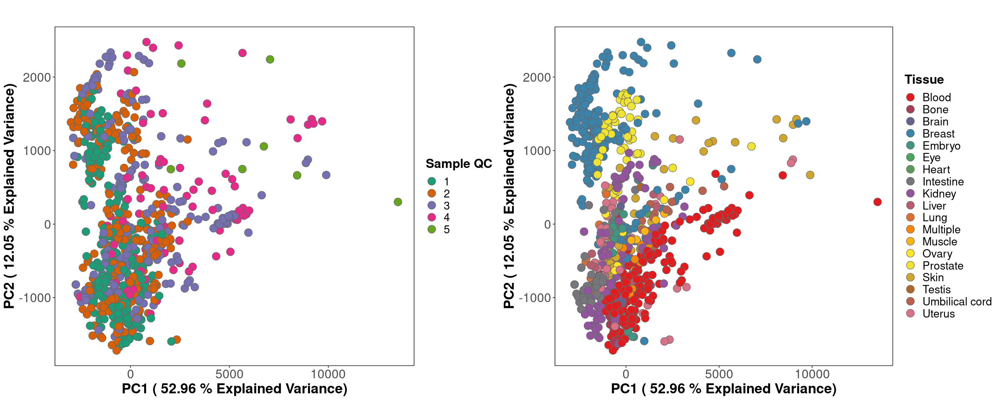

In [53]:
options(repr.plot.width=20, repr.plot.height=8)
cowplot::plot_grid(pc4, pc3b,
          label_size = 24,
         ncol = 2, nrow = 1 )

In [54]:
ggsave(pc4, width = 10, height = 8,
       filename = "/Users/rusi2317/projects/DBNascent_Analysis/figures/human_pca_sampQC_pc1_pc2.pdf", 
       bg = "transparent")

ggsave(pc4_2, width = 10, height = 8,
       filename = "/Users/rusi2317/projects/DBNascent_Analysis/figures/human_pca_sampQC_pc2_pc3.pdf", 
       bg = "transparent")

# Session Information 

In [55]:
sessionInfo()

R version 3.6.0 (2019-04-26)
Platform: x86_64-redhat-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /usr/lib64/R/lib/libRblas.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] org.Hs.eg.db_3.10.0  AnnotationDbi_1.48.0 IRanges_2.20.2      
 [4] S4Vectors_0.24.4     Biobase_2.46.0       BiocGenerics_0.32.0 
 [7] biomaRt_2.42.1       distances_0.1.8      tidyr_1.2.1         
[10] dplyr_1.0.10         RColorBrewer_1.1-3   factoextra_1.0.7    
[13] cowplot_1.1.1        ggridges_0.5.